# BDD - Data Analysis

### Highlevel Overview of the direct BDD100K dataset without parsing

Mainly to analyze and understand the raw data/schemas from the BDD100K dataset.


In [2]:
import json
from collections import Counter
from pathlib import Path
import math
from collections import Counter
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from collections import defaultdict

In [ ]:
# Paths to image folders
images_root = Path("../data/images")
train_images_dir = images_root / "train"
val_images_dir = images_root / "val"
test_images_dir = images_root / "test"

# Paths to labels
labels_root = Path("../data/BDD_labels")
train_labels_path = labels_root / "bdd100k_labels_images_train.json"
val_labels_path = labels_root / "bdd100k_labels_images_val.json"

In [4]:
# Load labels
with open(train_labels_path, "r") as f:
    train_labels = json.load(f)

with open(val_labels_path, "r") as f:
    val_labels = json.load(f)

#### Dataset Structure:
Counting the images and the labels in the dataset.

In [5]:
# Count images in JSON
print(f"Train (labels.json) images: {len(train_labels)}")
print(f"Val   (labels.json) images: {len(val_labels)}")

# Count image files on disk
train_image_files = list(train_images_dir.glob("*.jpg"))
val_image_files = list(val_images_dir.glob("*.jpg"))
test_image_files = list(test_images_dir.glob("*.jpg"))

print(f"Train (folder) images: {len(train_image_files)}")
print(f"Val   (folder) images: {len(val_image_files)}")
print(f"Test  (folder) images: {len(test_image_files)}")


Train (labels.json) images: 69863
Val   (labels.json) images: 10000
Train (folder) images: 70000
Val   (folder) images: 10000
Test  (folder) images: 20000


Since there is mismatch between the image counts in the labels.json and the actual image counts in the data/images folder, visualize the missing images!

In [6]:
train_file_names = {p.name for p in train_image_files}
val_file_names = {p.name for p in val_image_files}
test_file_names = {p.name for p in test_image_files}

train_label_names = {item["name"] for item in train_labels}
val_label_names = {item["name"] for item in val_labels}

# extra imagesin folder but not in labels.json
extra_train_files = train_file_names - train_label_names
extra_val_files = val_file_names - val_label_names

Extra train images in folder but not in labels.json: 137


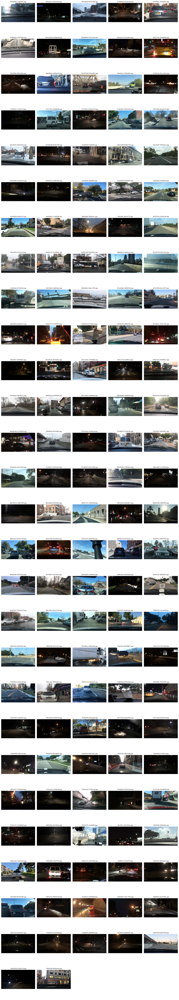

In [7]:
extra_train_list = sorted(extra_train_files)
num_images = len(extra_train_list)
print(f"Extra train images in folder but not in labels.json: {num_images}")

cols = 5
rows = math.ceil(num_images/cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
axes = axes.flatten()

for ax, fname in zip(axes, extra_train_list):
        img_path = train_images_dir / fname
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            ax.set_title(fname, fontsize=8)
            ax.axis("off")
        except Exception as e:
            ax.text(0.5, 0.5, f"Error\n{e}", ha="center", va="center")
            ax.axis("off")

for ax in axes[len(extra_train_list):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

Hence, the above images are not needed for training/analysis

#### Json Scehma Exploration

Checking the fields in the labels.json and its count

In [8]:
def label_field_summary(items):
    """Count how many objects have certain fields."""
    field_counts = Counter()
    for img in items:
        for obj in img.get("labels", []):
            for field in obj.keys():
                field_counts[field] += 1
    return field_counts

train_field_counts = label_field_summary(train_labels)
val_field_counts = label_field_summary(val_labels)

print("Train label field counts:", train_field_counts)
print("Val label field counts:  ", val_field_counts)

Train label field counts: Counter({'category': 1941237, 'attributes': 1941237, 'manualShape': 1941237, 'manualAttributes': 1941237, 'id': 1941237, 'box2d': 1286871, 'poly2d': 654366})
Val label field counts:   Counter({'category': 279237, 'attributes': 279237, 'manualShape': 279237, 'manualAttributes': 279237, 'id': 279237, 'box2d': 185526, 'poly2d': 93711})


Checking the classes in the dataset. From the output, it "lane" and "drivable area" can we ignored

In [9]:
train_categories = sorted({obj.get("category") for img in train_labels for obj in img.get("labels", [])})
val_categories = sorted({obj.get("category") for img in val_labels for obj in img.get("labels", [])})

print(f"Unique categories in train ({len(train_categories)}): {train_categories}")
print(f"Unique categories in val   ({len(val_categories)}):   {val_categories}")

Unique categories in train (12): ['bike', 'bus', 'car', 'drivable area', 'lane', 'motor', 'person', 'rider', 'traffic light', 'traffic sign', 'train', 'truck']
Unique categories in val   (12):   ['bike', 'bus', 'car', 'drivable area', 'lane', 'motor', 'person', 'rider', 'traffic light', 'traffic sign', 'train', 'truck']


Checking if there are timestamps incase, images could be stiched in chronological order.

In [10]:
print("Train unique timestamps:", sorted({img.get("timestamp") for img in train_labels}))
print("Val unique timestamps:", sorted({img.get("timestamp") for img in val_labels}))


Train unique timestamps: [10000]
Val unique timestamps: [10000]


Verify if all the images have image attributes.

In [ ]:
def check_attrs(train_items, val_items):
    keys = ["weather", "scene", "timeofday"]
    
    for name, data in [("Train", train_items), ("Val", val_items)]:
        ok = True
        for img in data:
            for k in keys:
                if k not in img.get("attributes", {}):
                    ok = False
        if ok:
            print(name, "OK")
        else:
            print(name, "MISSING")
            
check_attrs(train_labels, val_labels)

Train OK
Val OK


: 

#### Detection Class Distribution



In [12]:
detection_classes = [
    'bike', 'bus', 'car', 'motor', 'person', 'rider',
    'traffic light', 'traffic sign', 'train', 'truck'
]

Checking if there any detection class without bbox

In [13]:
def check_missing_bboxes(items):
    """
    Returns a list of (image_name, category) for any detection-class label
    that is missing its box2d field.
    """
    missing = []
    for img in items:
        for obj in img.get("labels", []):
            if obj["category"] in detection_classes:
                if "box2d" not in obj or obj["box2d"] is None:
                    missing.append((img["name"], obj["category"]))
    return missing


missing_train = check_missing_bboxes(train_labels)
missing_val   = check_missing_bboxes(val_labels)

print(f"Train: {len(missing_train)} objects without bbox")
print(f"Val:   {len(missing_val)} objects without bbox")


Train: 0 objects without bbox
Val:   0 objects without bbox


Count detection annotations for each split

In [ ]:
def count_detection_annotations(items):
    counts = Counter()
    for img in items:
        for obj in img.get("labels", []):
            if obj.get("category") in detection_classes and "box2d" in obj:
                counts["total"] += 1
                counts[obj["category"]] += 1
    return counts

train_counts = count_detection_annotations(train_labels)
val_counts = count_detection_annotations(val_labels)

print(f"Train total detection annotations: {train_counts['total']}")
print(f"Val total detection annotations:   {val_counts['total']}")
print(f"Overall total: {train_counts['total'] + val_counts['total']}")

print("\nTrain per-class counts:")
for cat in detection_classes:
    print(f"{cat}: {train_counts[cat]}")

print("\nVal per-class counts:")
for cat in detection_classes:
    print(f"{cat}: {val_counts[cat]}")


Train total detection annotations: 1286871
Val total detection annotations:   185526
Overall total: 1472397

Train per-class counts:
bike: 7210
bus: 11672
car: 713211
motor: 3002
person: 91349
rider: 4517
traffic light: 186117
traffic sign: 239686
train: 136
truck: 29971

Val per-class counts:
bike: 1007
bus: 1597
car: 102506
motor: 452
person: 13262
rider: 649
traffic light: 26885
traffic sign: 34908
train: 15
truck: 4245
